<a href="https://colab.research.google.com/github/giardinas-dev/advanced-ai-production/blob/main/XAI_rete_neurale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

OBIETTIVO


In [ ]:
!pip install lime scikit-image shap captum torch torchvision matplotlib numpy
!pip install pyALE
!pip install pandas

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 16.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 62.3 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=855a164ed0b76e67aa8dcdf3654ec9aa1a759c5022161fe466b691322f90fd10
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.

ERROR: Operation cancelled by user
^C


google / utils / trainer

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import StratifiedShuffleSplit
import numpy as np
import os
import shutil
from google.colab import drive
from sklearn.metrics import f1_score, classification_report



DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MODEL_NAME = "densenet"
LOCAL_MODEL_FOLDER = f"models/{MODEL_NAME}"
LOCAL_MODEL_PATH = os.path.join(LOCAL_MODEL_FOLDER, "model.pt")

drive.mount('/content/drive')

DRIVE_MODEL_FOLDER = "/content/drive/MyDrive/XAI"
DRIVE_MODEL_PATH = os.path.join(DRIVE_MODEL_FOLDER, "model.pt")

# Crea cartelle locali se non esistono
os.makedirs(LOCAL_MODEL_FOLDER, exist_ok=True)
os.makedirs(DRIVE_MODEL_FOLDER, exist_ok=True)

Mounted at /content/drive


In [ ]:
# @title Utils
import torch
import pandas as pd
from torch.utils.data import TensorDataset
from sklearn.model_selection import train_test_split
import numpy as np
import os
from collections import defaultdict

from torch.utils.data import Subset
import numpy as np
from collections import defaultdict
from torch.utils.data import DataLoader
from collections import Counter

def tensor_to_image(img, denormalize=True, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    # Sposta su CPU e converte in numpy
    if isinstance(img, torch.Tensor):
        img = img.cpu().detach()
    img = img.numpy()

    # Trasponi da CxHxW a HxWxC
    img = np.transpose(img, (1, 2, 0))

    if denormalize:
        mean = np.array(mean)
        std = np.array(std)
        img = img * std + mean
        img = np.clip(img, 0, 1)

    return img

def balanced_subset(dataset, ratio, seed=37):
    rng = np.random.default_rng(seed)
    if hasattr(dataset, "targets"):
        labels = dataset.targets

    class_indices = defaultdict(list)
    for idx, lbl in enumerate(labels):
        class_indices[int(lbl)].append(idx)
    # Numero di campioni per classe basato sulla ratio e sulla classe più piccola
    min_count_class = min(len(v) for v in class_indices.values())
    n_per_class = max(1, int(min_count_class * ratio))

    balanced_indices = []
    for cls, idx_list in class_indices.items():
        selected = rng.choice(idx_list, size=n_per_class, replace=False)
        balanced_indices.extend(selected)

    rng.shuffle(balanced_indices)
    return Subset(dataset, balanced_indices)


class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.min_val_loss = None
        self.counter = 0
        self.early_stop = False
        self.best_epoch = None
        self.trainer = None



    def reset(self):
        self.min_val_loss = None
        self.counter = 0
        self.early_stop = False
        self.best_epoch = None
        self.early_stop = False


    def __call__(self, validation_loss, model, epoch = None):
        if self.min_val_loss is None:
            self.min_val_loss = validation_loss
            self.save_checkpoint()
            self.best_epoch = epoch

        elif (self.min_val_loss - validation_loss) > self.min_delta:
            self.min_val_loss = validation_loss
            self.save_checkpoint()
            self.counter = 0
            self.best_epoch = epoch


        else:  # Nessun miglioramento
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                print(f"Modello salvato in {self.trainer.get_path()}")


    def save_checkpoint(self):
      self.trainer.save_model_and_log()


def dataset_check(dataset, batch_size=256, max_batches=None):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    label_counts = Counter()
    total_nulls = 0

    for i, (images, labels) in enumerate(loader):
        if max_batches and i >= max_batches:
            break

        # Conta label
        for lbl in labels:
            label_counts[int(lbl)] += 1

        # Controllo valori null / inf nei batch
        batch_nulls = torch.isnan(images).sum().item() + torch.isinf(images).sum().item()
        batch_nulls += (labels != labels).sum().item()
        total_nulls += batch_nulls

    # Output risultati
    print("✅ Controllo dataset:")
    print(f" - Numero totale valori null o inf: {total_nulls}")
    print(" - Distribuzione label:")
    for lbl, cnt in sorted(label_counts.items()):
        print(f"   Classe {lbl}: {cnt} immagini")



In [ ]:
# @title Class Trainer


import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
from tqdm import tqdm
import json
import matplotlib.gridspec as gridspec

class Trainer:
    def __init__(self, model, name, criterion, device, train_loader, val_loader, classes=None, early_stopping=None, logger = None):
        self.model = model.to(device)
        self.name = name
        self.criterion = criterion
        self.device = device
        self.classes = classes
        self.train_loader = train_loader
        self.test_loader = val_loader

        self.optimizer = None
        self.optimizer_name = None


        self.logger = logger
        self.last_training_info = None



    def set_early_stopping(self, early_stopping):
        self.early_stopping = early_stopping
        self.early_stopping.trainer = self

    def set_optimizer(self, optimizer, name):
        self.optimizer = optimizer
        self.optimizer_name = name
    def train_epoch(self,optimizer = None):
        print("train")
        if optimizer is None:
          optimizer = self.optimizer
        self.model.train()
        running_loss = 0.0
        processed_data = 0
        for data in tqdm(self.train_loader,desc='Train_epoch in progress'):
            inputs, labels = data[0].to(self.device), data[1].to(self.device)
            optimizer.zero_grad()
            outputs = self.model(inputs)
            loss = self.criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()*inputs.size(0)
            processed_data += len(inputs)

        return running_loss / processed_data

    def test_epoch(self, test_loader=None):
        print("test")
        if test_loader is None:
            test_loader = self.test_loader
        self.model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        all_preds = []
        all_labels = []

        with torch.no_grad():
            for data in tqdm(test_loader,desc='Test_epoch in progress'):
                inputs, labels = data[0].to(self.device), data[1].to(self.device)
                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)

                running_loss += loss.item()*inputs.size(0)
                _, predicted = torch.max(outputs, 1)
                labels_int = labels.int()


                all_preds.extend(predicted.cpu().numpy())
                all_labels.extend(labels_int.cpu().numpy())

                correct += (predicted == labels).sum().item()
                total += labels.size(0)

        f1 = f1_score(all_labels, all_preds, average='macro')

        return running_loss / total, correct / total, f1, all_preds, all_labels

    def final_validation(self,test_loader=None):
        _, accuracy, f1, all_preds, all_labels = self.test_epoch(test_loader)
        if not hasattr(self, 'last_training_info') or not isinstance(self.last_training_info, dict):
            self.last_training_info = {}
        self.last_training_info['final_accuracy'] = float(accuracy)  # converte in float se è torch.Tensor
        self.last_training_info['final_f1'] = float(f1)

        print(classification_report(all_labels, all_preds, digits=4))
        return accuracy, f1

    def train(self, test_loader=None, epochs=100, experiment_name=None, optimizer=None):

        if self.early_stopping is not None:
            self.early_stopping.reset()
        if optimizer is None:
            optimizer = self.optimizer
        if self.optimizer is None and optimizer is None:
            raise ValueError("Optimizer not set. Use set_optimizer() before training.")

        if test_loader is None:
            test_loader = self.test_loader
        print("traintain")
        train_losses = []
        val_losses = []
        val_accuracies = []
        val_f1 = []
        best_epoch = None

        for epoch in tqdm(range(epochs), desc="Training Progress"):

            train_loss = self.train_epoch(optimizer)
            val_loss, val_accuracy, f1, _, _ = self.test_epoch(test_loader)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            val_accuracies.append(val_accuracy)
            val_f1.append(f1)

            tqdm.write(f'Epoch {epoch+1}/{epochs}, F1 score:{f1:.4f}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

            if self.early_stopping is not None:
                self.early_stopping(val_loss, self.model, epoch)
                if self.early_stopping.early_stop:
                    best_epoch =  self.early_stopping.best_epoch
                    print("Early stopping")
                    break

        epochs_run = epoch + 1
        if experiment_name is None:
            experiment_name = f"experiment_{len(self.logger.get_all())+ 1}"



        exp_record = {
            "experiment_name": experiment_name,
            "optimizer": self.optimizer_name,
            "criterion": type(self.criterion).__name__,
            "train_losses": train_losses,
            "val_losses": val_losses,
            "val_accuracies": val_accuracies,
            "val_f1": val_f1,
            "epochs_run": epochs_run,
            "best_epoch_early_stopping": best_epoch
        }
        self.logger.log(exp_record)

        self.last_training_info = exp_record
        if not self.early_stopping.early_stop:
            self.save_model_and_log()
            print(f"Model salvato in {self.name}/model.pt")
        self.early_stopping.reset()
        self.save_model_and_log(log_filename = f"log_{experiment_name}.json", log_data = exp_record)

        return  val_f1,train_losses, val_losses, val_accuracies, epochs_run, best_epoch


    def plot_accuracies(self):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.get_cmap('tab10')
        for i,exp in enumerate(self.logger.get_all()):
            color = colors(i % 10)
            epochs = range(1, exp["epochs_run"] + 1)
            plt.plot(epochs, exp["val_accuracies"], label=f'Val Accuracy ({exp["optimizer"]}-Epoche:{exp["epochs_run"]})',color=color)

            # Linea verticale miglior val accuracy (best_epoch)
            if exp.get("best_epoch_early_stopping") is not None:
                plt.axvline(exp["best_epoch_early_stopping"] + 1, color=color, linestyle='--', alpha=0.7,
                            label=f'Best Val Accuracy Epoch - ({exp["optimizer"]}-Epoche:{exp["best_epoch_early_stopping"]})')



        plt.xlabel("Epochs")
        plt.ylabel("Validation Accuracy")
        plt.title(f"{self.name} - Validation Accuracy")
        plt.legend()
        plt.show()

    def plot_losses(self):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.get_cmap('tab10')

        for i, exp in enumerate(self.logger.get_all()):
            color = colors(i % 10)
            epochs = range(1, exp["epochs_run"] + 1)
            plt.plot(epochs, exp["train_losses"], linestyle="--", label=f'Train Loss ({exp["optimizer"]})', color=color)
            plt.plot(epochs, exp["val_losses"], label=f'Val Loss ({exp["optimizer"]})', color=color)

            if exp.get("best_epoch_early_stopping") is not None:
                plt.axvline(exp["best_epoch_early_stopping"] + 1, color=color, linestyle=':', alpha=0.7,
                            label=f'Best Val Loss Epoch ({exp["optimizer"]})')

        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.title(f"{self.name} - Train & Validation Loss")
        plt.legend()
        plt.grid(True, linestyle="--", alpha=0.4)
        plt.tight_layout()
        plt.show()


    def plot_f1_scores(self):
        plt.figure(figsize=(10, 6))
        colors = plt.cm.get_cmap('tab10')
        for i, exp in enumerate(self.logger.get_all()):
            if "val_f1" not in exp:
                continue
            f1_scores = exp["val_f1"]
            epochs = range(1, len(f1_scores) + 1)
            color = colors(i % 10)
            plt.plot(epochs, f1_scores, label=f'Val F1-score ({exp["optimizer"]}-Epochs:{exp["epochs_run"]})', color=color)

            # Linea verticale miglior epoca (early stopping)
            if exp.get("best_epoch_early_stopping") is not None:
                plt.axvline(exp["best_epoch_early_stopping"] + 1, color=color, linestyle='--', alpha=0.7,
                            label=f'Best Val F1 Epoch ({exp["optimizer"]}-Epochs:{exp["best_epoch_early_stopping"]})')

        plt.xlabel("Epochs")
        plt.ylabel("Validation F1-score")
        plt.title(f"{self.name} - Validation F1-score")
        plt.legend()
        plt.grid(True)
        plt.show()



    def get_last_training_info(self):
          print("="*50)
          print(f"Experiment Summary: {self.last_training_info.get('experiment_name', 'N/A')}")
          print("-"*50)
          print(f"Optimizer:           {self.last_training_info.get('optimizer', 'N/A')}")
          print(f"Criterion:           {self.last_training_info.get('criterion', 'N/A')}")
          print(f"Epochs Run:          {self.last_training_info.get('epochs_run', 'N/A')}")
          print(f"best_epoch_early_stopping: {self.last_training_info.get('best_epoch_early_stopping', 'N/A')}")
          print("-"*50)
          print(f"Final Training Loss: {self.last_training_info['train_losses'][-1]:.4f}")
          print(f"Final Validation Loss: {self.last_training_info['val_losses'][-1]:.4f}")
          print(f"Final F1 score: {self.last_training_info['final_f1']:.4f}")
          print(f"Final Validation Accuracy: {self.last_training_info['final_accuracy']:.4f}")
          print("="*50)
          return self.last_training_info




    def plot_confusion_matrix(self, test_loader=None, model_name='', opt_name='', epochs=0):
        if test_loader is None:
            test_loader = self.test_loader
        self.model.eval()
        y_true = []
        y_pred = []

        with torch.no_grad():
            for i, data in enumerate(test_loader, 0):
                inputs, labels = data[0].to(self.device), data[1].to(self.device)
                outputs = self.model(inputs)
                _, predicted = torch.max(outputs, 1)
                y_true.extend(labels.cpu().numpy())
                y_pred.extend(predicted.cpu().numpy())

        cm = confusion_matrix(y_true, y_pred)
        num_classes = len(self.classes)

        plt.figure(figsize=(10,7))
        # Usa numeri come etichette
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=np.arange(num_classes),
                    yticklabels=np.arange(num_classes))
        plt.xlabel('Predicted')
        plt.ylabel('True')
        title = f"{model_name} with {opt_name} optimizer for {epochs} epochs"
        plt.title(f"Confusion Matrix:\n{title}", color='blue')
        plt.show()

        # Stampa la legenda separata per riferimento
        print("\nClass index to label mapping:")
        for idx, label in enumerate(self.classes):
            print(f"{idx}: {label}")


    def save_model_and_log(self, model_filename="model.pt", log_filename=None, log_data=None):
            folder = os.path.join("models", self.name)
            os.makedirs(folder, exist_ok=True)

            model_path = os.path.join(folder, model_filename)




            if log_filename is not None and log_data is not None:
                log_path = os.path.join(folder, log_filename)
                with open(log_path, 'w') as f:
                    json.dump(log_data, f, indent=4)
                print(f"Log salvato in: {log_path}")
            else:
              torch.save(self.model.state_dict(), model_path)



    def load_model(self, model_filename="model.pt"):
            model_path = os.path.join("models", self.name, model_filename)
            if os.path.isfile(model_path):
                self.model.load_state_dict(torch.load(model_path, map_location=self.device))
                self.model.to(self.device)
                print(f"Modello caricato da: {model_path}")
            else:
                print(f"File non trovato: {model_path}")

    def get_path(self):
            return "models/"+self.name

    def show_errors(self, test_loader=None, max_errors=10):
            if test_loader is None:
                test_loader = self.test_loader
            self.model.eval()

            all_wrong_images = []
            all_true_labels = []
            all_pred_labels = []

            with torch.no_grad():
                for inputs, labels in test_loader:
                    inputs = inputs.to(self.device)
                    labels = labels.to(self.device)
                    outputs = self.model(inputs)
                    _, preds = torch.max(outputs, 1)

                    wrong_idxs = (preds != labels).nonzero(as_tuple=False).squeeze()
                    if wrong_idxs.dim() == 0 and wrong_idxs.numel() > 0:
                        wrong_idxs = wrong_idxs.unsqueeze(0)

                    for idx in wrong_idxs:
                        all_wrong_images.append(inputs[idx].cpu())
                        all_true_labels.append(labels[idx].item())
                        all_pred_labels.append(preds[idx].item())

            if len(all_wrong_images) > max_errors:
                selected_idxs = random.sample(range(len(all_wrong_images)), max_errors)
            else:
                selected_idxs = range(len(all_wrong_images))



            plt.figure(figsize=(20, 24))
            gs = gridspec.GridSpec(6, 5, hspace=0.6, wspace=0.3)
            for i, idx in enumerate(selected_idxs):
                ax = plt.subplot(gs[i])
                ax.imshow(tensor_to_image(all_wrong_images[idx]))
                t_label = self.classes[all_true_labels[idx]] if self.classes else all_true_labels[idx]
                p_label = self.classes[all_pred_labels[idx]] if self.classes else all_pred_labels[idx]
                ax.set_title(f"True: {t_label}\nPred: {p_label}", fontsize=12)
                ax.axis('off')
            plt.show()

    def pre_process_image(self,image):
        transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(lambda img: img.convert("RGB")),  # forza a 3 canali
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

        img_tensor = transform(image).unsqueeze(0).to(self.device)
        return img_tensor


    def predict(self, image, class_names=None):
        self.model.eval()
        with torch.no_grad():
            outputs = self.model(self.pre_process_image(image))
            _, pred = torch.max(outputs, 1)

        pred_class = pred.item()

        if class_names:
            return class_names[pred_class]
        else:
            return pred_class

    def predict_proba(self, images_np):
      #Compatibile con LIME
      images_tensor = torch.tensor(images_np, dtype=torch.float32).permute(0, 3, 1, 2).to(self.device)

      self.model.eval()
      with torch.no_grad():
          outputs = self.model(images_tensor)
          probs = torch.softmax(outputs, dim=1)

      return probs.cpu().numpy()



class ExperimentLogger:
    def __init__(self):
        self.experiments = []

    def log(self, experiment_info):
        self.experiments.append(experiment_info)

    def get_all(self):
        return self.experiments

    def last(self):
        return self.experiments[-1] if self.experiments else None

## Il codice delle funzioni relative all'implementazione dei grafici/ errori è stato realizzato in parte con l'aiuto di chat-GPT.

DATASET

In [ ]:
BATCH_SIZE = 64
EPOCHS = 8
LR = 0.0001

print("✅ Step 1: Definizione trasformazioni e caricamento dataset")
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(lambda img: img.convert("RGB")),  # forza RGB
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

full_dataset = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
print(f" - Dataset originale caricato: {len(full_dataset)} immagini ( NON BILANCIATO )")

print("✅ Step 2: Creazione subset bilanciato del training set")
subset_dataset = balanced_subset(full_dataset, ratio=0.2)
print(f" - Subset bilanciato: {len(subset_dataset)} immagini")

train_loader = DataLoader(subset_dataset, batch_size=BATCH_SIZE, shuffle=True)
print(f" - DataLoader train creato con batch size {BATCH_SIZE}")

print("✅ Step 3: Creazione subset bilanciato del test set")
test_dataset = datasets.MNIST(root="./data", train=False, download=True, transform=transform)
subset_testset = balanced_subset(test_dataset, ratio=0.2)
print(f" - Subset test bilanciato: {len(subset_testset)} immagini")

test_loader = DataLoader(subset_testset, batch_size=BATCH_SIZE, shuffle=False)
print(f" - DataLoader test creato con batch size {BATCH_SIZE}")

print("✅ Step 4.1: Analisi statistiche Reduced Dataset")
dataset_check(subset_dataset, batch_size=BATCH_SIZE, max_batches=None)
print("✅ Step 4.2: Analisi statistiche Test set")
dataset_check(subset_testset, batch_size=BATCH_SIZE, max_batches=None)

print("✅ Step 5: Creazione modello DenseNet121 pretrainato")
model = models.densenet121(pretrained=True)
model.classifier = nn.Linear(model.classifier.in_features, 10)
model = model.to(DEVICE)
print(f" - Modello creato e spostato su device: {DEVICE}")

print("✅ Step 6: Setup training")
logger = ExperimentLogger()
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)
early_stopping = EarlyStopping(patience=5, min_delta=0)


✅ Step 1: Definizione trasformazioni e caricamento dataset


100%|██████████| 9.91M/9.91M [00:00<00:00, 11.3MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 341kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 2.69MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 8.38MB/s]


 - Dataset originale caricato: 60000 immagini ( NON BILANCIATO )
✅ Step 2: Creazione subset bilanciato del training set
 - Subset bilanciato: 10840 immagini
 - DataLoader train creato con batch size 64
✅ Step 3: Creazione subset bilanciato del test set
 - Subset test bilanciato: 1780 immagini
 - DataLoader test creato con batch size 64
✅ Step 4.1: Analisi statistiche Reduced Dataset
✅ Controllo dataset:
 - Numero totale valori null o inf: 0
 - Distribuzione label:
   Classe 0: 1084 immagini
   Classe 1: 1084 immagini
   Classe 2: 1084 immagini
   Classe 3: 1084 immagini
   Classe 4: 1084 immagini
   Classe 5: 1084 immagini
   Classe 6: 1084 immagini
   Classe 7: 1084 immagini
   Classe 8: 1084 immagini
   Classe 9: 1084 immagini
✅ Step 4.2: Analisi statistiche Test set


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Controllo dataset:
 - Numero totale valori null o inf: 0
 - Distribuzione label:
   Classe 0: 178 immagini
   Classe 1: 178 immagini
   Classe 2: 178 immagini
   Classe 3: 178 immagini
   Classe 4: 178 immagini
   Classe 5: 178 immagini
   Classe 6: 178 immagini
   Classe 7: 178 immagini
   Classe 8: 178 immagini
   Classe 9: 178 immagini
✅ Step 5: Creazione modello DenseNet121 pretrainato
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 139MB/s]

 - Modello creato e spostato su device: cpu
✅ Step 6: Setup training


In [ ]:
trainer = Trainer(
    model=model,
    name=MODEL_NAME,
    criterion=criterion,
    device=DEVICE,
    train_loader=train_loader,
    val_loader=test_loader,
    classes=[str(i) for i in range(10)],
    logger=logger
)
trainer.set_optimizer(optimizer, "Adam")
trainer.set_early_stopping(early_stopping)
print(" - Trainer pronto, ottimizzatore e early stopping impostati")
print("✅ Step trainer completati")

 - Trainer pronto, ottimizzatore e early stopping impostati
✅ Step trainer completati


MODELLO

Modello trovato su Drive: /content/drive/MyDrive/XAI/model.pt
Modello caricato da: models/densenet/model.pt
test


Test_epoch in progress: 100%|██████████| 28/28 [00:09<00:00,  3.04it/s]


              precision    recall  f1-score   support

           0     1.0000    0.9775    0.9886       178
           1     1.0000    0.9888    0.9944       178
           2     1.0000    0.9944    0.9972       178
           3     0.9943    0.9831    0.9887       178
           4     0.9943    0.9775    0.9858       178
           5     0.9943    0.9775    0.9858       178
           6     0.9727    1.0000    0.9861       178
           7     0.9780    1.0000    0.9889       178
           8     0.9944    0.9888    0.9915       178
           9     0.9622    1.0000    0.9807       178

    accuracy                         0.9888      1780
   macro avg     0.9890    0.9888    0.9888      1780
weighted avg     0.9890    0.9888    0.9888      1780

Final Accuracy: 0.9888, Final F1: 0.9888


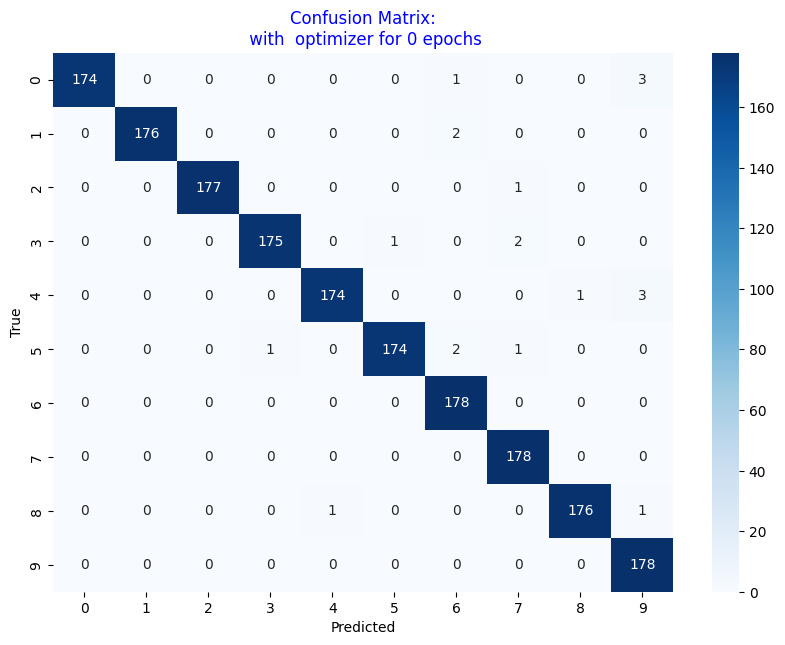


Class index to label mapping:
0: 0
1: 1
2: 2
3: 3
4: 4
5: 5
6: 6
7: 7
8: 8
9: 9


In [ ]:
# 5. Carica modello da Drive se presente
if os.path.isfile(DRIVE_MODEL_PATH):
    print(f"Modello trovato su Drive: {DRIVE_MODEL_PATH}")
    shutil.copy(DRIVE_MODEL_PATH, LOCAL_MODEL_PATH)
    trainer.load_model()
else:
    print("Modello non trovato su Drive, si procede con training.")
    f1_scores, train_losses, val_losses, val_accs, epochs_run, best_epoch = trainer.train(test_loader=test_loader, epochs=EPOCHS)
    trainer.save_model_and_log()
    shutil.copy(LOCAL_MODEL_PATH, DRIVE_MODEL_PATH)
    print(f"Modello salvato localmente e copiato su Drive: {DRIVE_MODEL_PATH}")



accuracy, f1 = trainer.final_validation()
print(f"Final Accuracy: {accuracy:.4f}, Final F1: {f1:.4f}")
if not os.path.isfile(DRIVE_MODEL_PATH):
  trainer.plot_accuracies()
  trainer.plot_losses()
trainer.plot_confusion_matrix()

ERRORI

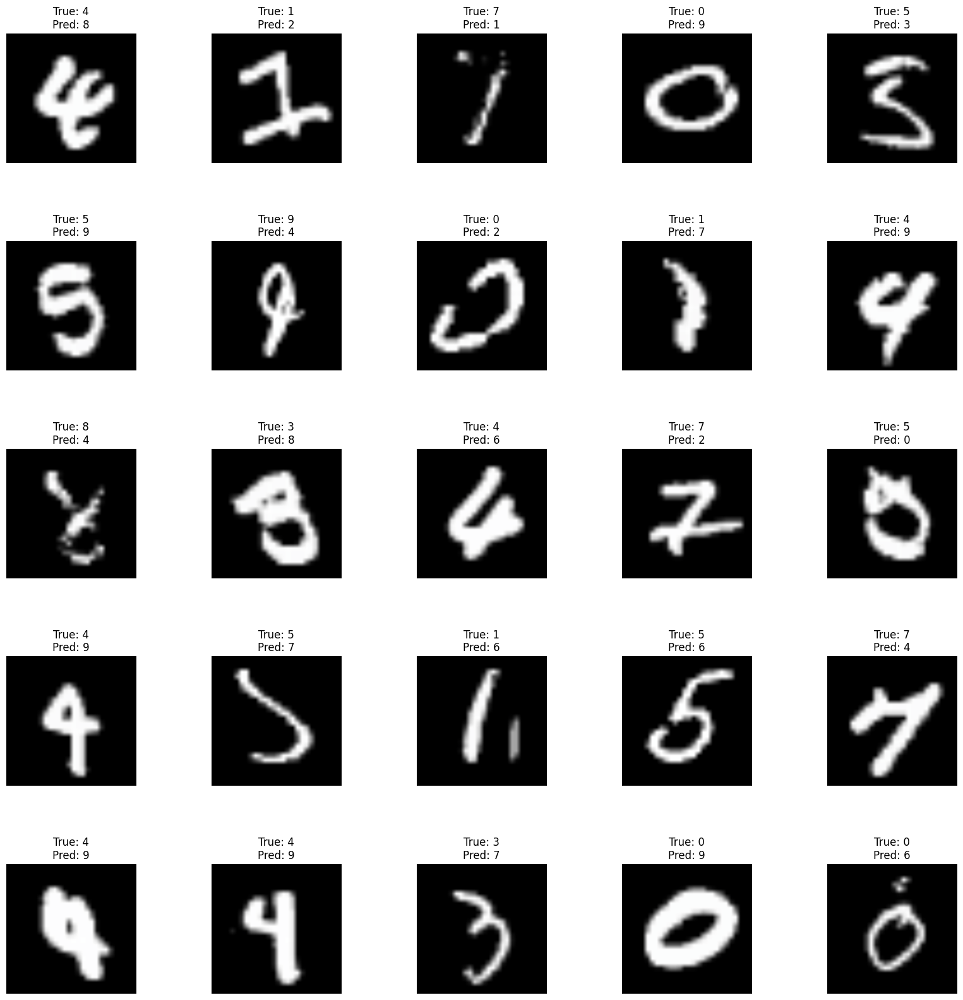

In [ ]:

new_testset = datasets.MNIST(root="./data", train=False, download=True, transform=transform)
new_subset_testset = balanced_subset(test_dataset, ratio=0.3)


new_testloader = DataLoader(new_subset_testset, batch_size=BATCH_SIZE, shuffle=False)
trainer.show_errors(test_loader=new_testloader, max_errors=30)

XAI MODEL

In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from lime import lime_image
from skimage.segmentation import slic
import shap
from captum.attr import IntegratedGradients, LayerGradCam, Saliency, Occlusion

class XAI_Model:
    def __init__(self, trainer, train_data=None):
        self.trainer = trainer
        self.train_data = train_data


    def _to_numpy_img(self, tensor):
        """Converte torch tensor [C,H,W] in immagine numpy [H,W,C] normalizzata per plt"""
        img = tensor.squeeze().cpu().detach().numpy()
        if img.ndim == 3:  # C,H,W
            img = np.transpose(img, (1, 2, 0))
        img = (img - img.min()) / (img.max() - img.min())  # normalizza [0,1]
        return img

    def lime_class_explanations(self , dataset, num_imgs_per_class=5, num_samples=1000):
        print("[INFO] Avvio analisi LIME per dataset...")
        explainer = lime_image.LimeImageExplainer()
        n_classes = 10
        agg_masks = {}

        for c in range(10):
            print(f"\n[INFO] Classe {c} → seleziono immagini...")
            imgs_c = [self._to_numpy_img(img) for img, label in dataset if int(label) == c][:num_imgs_per_class]
            print(f"[DEBUG] Numero immagini prese per classe {c}: {len(imgs_c)}")

            masks = []

            for i, img in enumerate(imgs_c):
                print(f"[INFO] Elaboro immagine {i+1}/{len(imgs_c)} della classe {c}")

                explanation = explainer.explain_instance(
                    img.astype(np.double),
                    classifier_fn=lambda x: self.trainer.predict_proba(x),
                    top_labels=5,
                    hide_color=0,
                    num_samples=num_samples,
                    segmentation_fn=lambda x: slic(x, n_segments=20, compactness=10, sigma=1)
                )

                print(f"[DEBUG] Top labels trovate da LIME: {explanation.top_labels}")

                if c in explanation.top_labels:
                    label_to_explain = c
                    print(f"[OK] Classe {c} presente nelle top_labels, uso questa.")
                else:
                    label_to_explain = explanation.top_labels[0]
                    print(f"[WARN] Classe {c} NON trovata. Spiego invece la classe predetta {label_to_explain}.")

                temp, mask = explanation.get_image_and_mask(
                    label_to_explain,
                    positive_only=True,
                    num_features=5,
                    hide_rest=False
                )
                masks.append(mask)

            # media delle maschere per la classe
            agg_mask = np.mean(masks, axis=0)
            agg_masks[c] = agg_mask
            print(f"[INFO] Finita elaborazione classe {c}, calcolata maschera media.")

        print("\n[INFO] Visualizzazione delle maschere aggregate...")
        cols = 5
        rows = int(np.ceil(n_classes / cols))
        plt.figure(figsize=(4*cols, 4*rows))
        for i, (c, mask) in enumerate(agg_masks.items()):
            plt.subplot(rows, cols, i+1)
            plt.imshow(mask, cmap="hot")
            plt.title(f"Classe {c}")
            plt.axis("off")
        plt.tight_layout()
        plt.show()

        print("[INFO] Analisi LIME completata.")
        return agg_masks

    def shap_class_explanations(self, dataset, num_imgs_per_class=5, background_size=50):
        """
        SHAP per DenseNet
        """
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        n_classes = 10
        agg_exps = {}

        dataset_list = [(img, label) for img, label in dataset]

        background_imgs = [img for img, _ in dataset_list[:background_size]]

        # funzione per convertire 1x28x28 -> 3x224x224 + normalizzazione
        normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                        std=[0.229, 0.224, 0.225])


        def preprocess(img):
            # duplica canale solo se 1
            if img.shape[0] == 1:
                img = img.repeat(3,1,1)  # 3x28x28
            img = img.float() / 255.0
            img = F.interpolate(img.unsqueeze(0), size=(224,224), mode='bilinear', align_corners=False).squeeze(0)
            normalize = transforms.Normalize(mean=[0.485,0.456,0.406],
                                            std=[0.229,0.224,0.225])
            img = normalize(img)
            return img


        background = torch.stack([preprocess(img) for img in background_imgs]).to(device)

        explainer = shap.GradientExplainer(self.trainer.model, background)
        print("[INFO] Explainer pronto.")

        for c in range(n_classes):
            print(f"\n[INFO] Classe {c} → seleziono immagini")
            imgs_c = [img for img, label in dataset_list if label == c][:num_imgs_per_class]

            if len(imgs_c) == 0:
                print(f"[WARN] Nessuna immagine trovata per classe {c}, proseguo.")
                continue

            imgs_c = torch.stack([preprocess(img) for img in imgs_c]).to(device)
            print(f"[INFO] Calcolo valori SHAP per {len(imgs_c)} immagini della classe {c}...")
            shap_values = explainer.shap_values(imgs_c)


            if isinstance(shap_values, list):
                # lista di array per classe
                if c < len(shap_values):
                    exp_class = shap_values[c]  # shape: (num_imgs, C, H, W)
                else:
                    print(f"[WARN] Classe {c} non presente in shap_values, proseguo.")
                    continue
            else:
                if shap_values.ndim == 5:  # (num_imgs, C, H, W, num_classes)
                    exp_class = shap_values[..., c]  # → (num_imgs, C, H, W)
                elif shap_values.ndim == 4:  # (num_imgs, C, H, W)
                    exp_class = shap_values
                else:
                    raise ValueError(f"shape of shap_values errato: {shap_values.shape}")

            # aggrego con media
            #agg_mask = np.mean(exp_class, axis=0).squeeze()  # (224,224)
            agg_mask = exp_class.mean(axis=0).mean(axis=0)  # (H, W)
            agg_exps[c] = agg_mask
            print(f"[INFO] Maschera aggregata calcolata per classe {c}.")

        print("\n[INFO] Visualizzazione heatmap SHAP aggregate...")
        cols = 5
        rows = int(np.ceil(n_classes / cols))
        plt.figure(figsize=(4*cols, 4*rows))
        for i, (c, mask) in enumerate(agg_exps.items()):
            plt.subplot(rows, cols, i+1)
            plt.imshow(mask, cmap="seismic")
            plt.title(f"Classe {c}")
            plt.axis("off")
        plt.tight_layout()
        plt.show()

        print("[INFO] Analisi SHAP completata.")
        return agg_exps

    def integrated_gradients_gradcam(self, test_loader, num_classes=10):
        self.trainer.model.eval()
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Disabilita ReLU inplace
        for module in self.trainer.model.modules():
            if isinstance(module, torch.nn.ReLU) and module.inplace:
                module.inplace = False

        # Seleziona un'immagine per ciascuna classe
        selected = {}
        for images, labels in test_loader:
            for img, lbl in zip(images, labels):
                lbl_int = int(lbl.item())
                if lbl_int not in selected:
                    selected[lbl_int] = (img.unsqueeze(0).to(device), lbl.to(device))
                if len(selected) >= num_classes:
                    break
            if len(selected) >= num_classes:
                break


        for lbl_int, (input_img, input_label) in selected.items():
            # Integrated Gradients
            ig = IntegratedGradients(self.trainer.model)
            ig_attr = ig.attribute(input_img.clone(), target=input_label, n_steps=50)

            # GradCAM
            target_layer = self.trainer.model.features[-1]
            gradcam = LayerGradCam(self.trainer.model, target_layer)
            gradcam_attr = gradcam.attribute(input_img.clone(), target=input_label)

            fig, axs = plt.subplots(1, 3, figsize=(18,6))
            orig_img = self._to_numpy_img(input_img)

            axs[0].imshow(orig_img)
            axs[0].set_title(f"Original\nTrue:{input_label.item()}")
            axs[0].axis("off")

            axs[1].imshow(orig_img)
            axs[1].imshow(self._to_numpy_img(ig_attr.abs().sum(dim=1)), cmap="hot", alpha=0.5)
            axs[1].set_title("Integrated Gradients")
            axs[1].axis("off")

            gradcam_map = F.interpolate(
                gradcam_attr,
                size=orig_img.shape[:2],
                mode="bilinear",
                align_corners=False
            ).squeeze().cpu().detach().numpy()

            axs[2].imshow(orig_img)
            axs[2].imshow(gradcam_map, cmap="hot", alpha=0.5)
            axs[2].set_title("GradCAM")
            axs[2].axis("off")

            plt.tight_layout()
            plt.show()


    def occlusion_saliency(self, test_loader, num_classes=10):

            self.trainer.model.eval()
            device = next(self.trainer.model.parameters()).device

            # Seleziona un'immagine per ciascuna classe
            selected = {}
            for images, labels in test_loader:
                for img, lbl in zip(images, labels):
                    lbl_int = int(lbl.item())
                    if lbl_int not in selected:
                        selected[lbl_int] = (img.unsqueeze(0).to(device), lbl.to(device))
                    if len(selected) >= num_classes:
                        break
                if len(selected) >= num_classes:
                    break

            for lbl_int, (input_img, input_label) in selected.items():
                # Saliency
                saliency = Saliency(self.trainer.model)
                sal_attr = saliency.attribute(input_img.clone(), target=input_label)

                # Occlusion
                occlusion = Occlusion(self.trainer.model)
                occ_attr = occlusion.attribute(
                    input_img.clone(),
                    target=input_label,
                    strides=(3, 4, 4),              # stride compatibile con input 3xHxW
                    sliding_window_shapes=(3, 15, 15),  # dimensione finestra più adatta a 28x28
                    baselines=0
                )

                fig, axs = plt.subplots(1, 3, figsize=(18, 6))
                orig_img = self._to_numpy_img(input_img)

                axs[0].imshow(orig_img)
                axs[0].set_title(f"Original\nTrue:{input_label.item()}")
                axs[0].axis("off")

                # Saliency map
                sal_map = sal_attr.abs().sum(dim=1).squeeze().cpu().detach().numpy()
                axs[1].imshow(orig_img)
                axs[1].imshow(sal_map, cmap="hot", alpha=0.5)
                axs[1].set_title("Saliency")
                axs[1].axis("off")

                # Occlusion map
                occ_map = occ_attr.abs().sum(dim=1).squeeze().cpu().detach().numpy()
                axs[2].imshow(orig_img)
                axs[2].imshow(occ_map, cmap="hot", alpha=0.5)
                axs[2].set_title("Occlusion")
                axs[2].axis("off")

                plt.tight_layout()
                plt.show()

# L’implementazione dei metodi di analisi dei pixel (inclusi SHAP e
# visualizzazioni di feature importances) è stata realizzata con il supporto di ChatGPT (OpenAI).
# Anche i commenti al codice e gli output di spiegazione dei risultati sono stati
# redatti grazie al suo contributo interattivo.

In [ ]:
xai = XAI_Model(trainer, train_data=None)

LIME

SHAP


[INFO] Avvio analisi LIME per dataset...

[INFO] Classe 0 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 0: 5
[INFO] Elaboro immagine 1/5 della classe 0


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 1, 6, 3, 8]
[OK] Classe 0 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 0


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 6, 9, 1, 4]
[OK] Classe 0 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 0


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 6, 9, 1, 4]
[OK] Classe 0 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 0


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 9, 1, 2]
[OK] Classe 0 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 0


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 1, 6, 9, 3]
[OK] Classe 0 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 0, calcolata maschera media.

[INFO] Classe 1 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 1: 5
[INFO] Elaboro immagine 1/5 della classe 1


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 3, 4]
[OK] Classe 1 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 1


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 3, 7]
[OK] Classe 1 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 1


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 3, 7]
[OK] Classe 1 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 1


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 6, 0, 3, 7]
[OK] Classe 1 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 1


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 6, 0, 8, 4]
[OK] Classe 1 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 1, calcolata maschera media.

[INFO] Classe 2 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 2: 5
[INFO] Elaboro immagine 1/5 della classe 2


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 3, 8]
[WARN] Classe 2 NON trovata. Spiego invece la classe predetta 1.
[INFO] Elaboro immagine 2/5 della classe 2


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 2, 8]
[OK] Classe 2 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 2


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 1, 2]
[OK] Classe 2 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 2


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 1, 4]
[WARN] Classe 2 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 5/5 della classe 2


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 8, 3]
[WARN] Classe 2 NON trovata. Spiego invece la classe predetta 6.
[INFO] Finita elaborazione classe 2, calcolata maschera media.

[INFO] Classe 3 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 3: 5
[INFO] Elaboro immagine 1/5 della classe 3


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 8, 3]
[OK] Classe 3 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 3


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 8, 1, 3, 0]
[OK] Classe 3 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 3


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 8, 3, 0, 1]
[OK] Classe 3 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 3


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 8, 3, 1, 0]
[OK] Classe 3 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 3


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 8, 3, 1, 0]
[OK] Classe 3 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 3, calcolata maschera media.

[INFO] Classe 4 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 4: 5
[INFO] Elaboro immagine 1/5 della classe 4


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 8, 4]
[OK] Classe 4 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 4


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 8, 3]
[WARN] Classe 4 NON trovata. Spiego invece la classe predetta 1.
[INFO] Elaboro immagine 3/5 della classe 4


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 6, 0, 4, 8]
[OK] Classe 4 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 4


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [8, 6, 1, 0, 4]
[OK] Classe 4 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 4


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 4, 8]
[OK] Classe 4 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 4, calcolata maschera media.

[INFO] Classe 5 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 5: 5
[INFO] Elaboro immagine 1/5 della classe 5


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 8, 3]
[WARN] Classe 5 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 2/5 della classe 5


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 1, 3]
[WARN] Classe 5 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 3/5 della classe 5


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 1, 6, 3, 8]
[WARN] Classe 5 NON trovata. Spiego invece la classe predetta 0.
[INFO] Elaboro immagine 4/5 della classe 5


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 1, 3]
[WARN] Classe 5 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 5/5 della classe 5


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 2, 3]
[WARN] Classe 5 NON trovata. Spiego invece la classe predetta 6.
[INFO] Finita elaborazione classe 5, calcolata maschera media.

[INFO] Classe 6 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 6: 5
[INFO] Elaboro immagine 1/5 della classe 6


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [0, 6, 1, 9, 8]
[OK] Classe 6 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 6


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 9, 3]
[OK] Classe 6 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 6


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 3, 8]
[OK] Classe 6 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 6


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 3, 8]
[OK] Classe 6 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 6


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 1, 8, 3]
[OK] Classe 6 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 6, calcolata maschera media.

[INFO] Classe 7 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 7: 5
[INFO] Elaboro immagine 1/5 della classe 7


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 3, 8]
[WARN] Classe 7 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 2/5 della classe 7


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 7, 8]
[OK] Classe 7 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 7


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 3, 8]
[WARN] Classe 7 NON trovata. Spiego invece la classe predetta 6.
[INFO] Elaboro immagine 4/5 della classe 7


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 6, 0, 8, 7]
[OK] Classe 7 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 7


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 8, 7]
[OK] Classe 7 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 7, calcolata maschera media.

[INFO] Classe 8 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 8: 5
[INFO] Elaboro immagine 1/5 della classe 8


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 1, 0, 8, 3]
[OK] Classe 8 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 8


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 8, 0, 1, 3]
[OK] Classe 8 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 8


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [6, 0, 8, 1, 9]
[OK] Classe 8 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 4/5 della classe 8


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [8, 6, 0, 1, 3]
[OK] Classe 8 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 8


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [8, 6, 1, 0, 3]
[OK] Classe 8 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 8, calcolata maschera media.

[INFO] Classe 9 → seleziono immagini...
[DEBUG] Numero immagini prese per classe 9: 5
[INFO] Elaboro immagine 1/5 della classe 9


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [9, 6, 1, 0, 8]
[OK] Classe 9 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 2/5 della classe 9


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [9, 6, 1, 0, 8]
[OK] Classe 9 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 3/5 della classe 9


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [1, 0, 6, 8, 3]
[WARN] Classe 9 NON trovata. Spiego invece la classe predetta 1.
[INFO] Elaboro immagine 4/5 della classe 9


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [9, 6, 1, 8, 0]
[OK] Classe 9 presente nelle top_labels, uso questa.
[INFO] Elaboro immagine 5/5 della classe 9


  0%|          | 0/1000 [00:00<?, ?it/s]

[DEBUG] Top labels trovate da LIME: [9, 6, 1, 0, 3]
[OK] Classe 9 presente nelle top_labels, uso questa.
[INFO] Finita elaborazione classe 9, calcolata maschera media.

[INFO] Visualizzazione delle maschere aggregate...


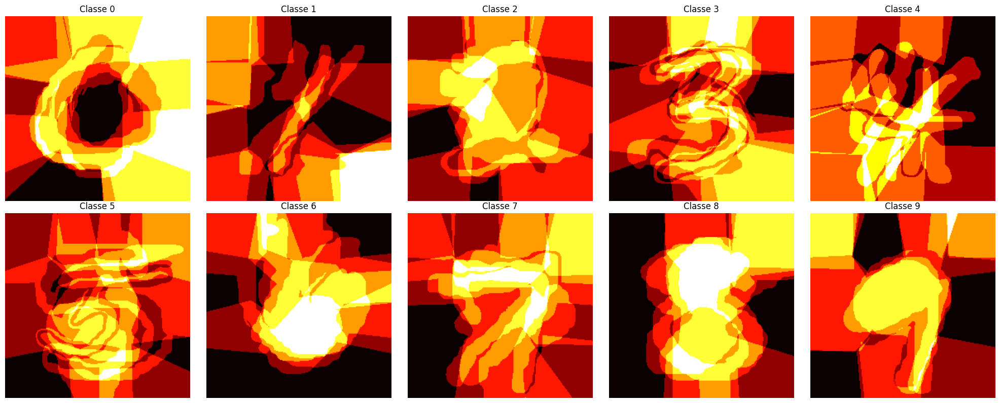

[INFO] Analisi LIME completata.


In [ ]:
lime_exp = xai.lime_class_explanations(subset_dataset)

[INFO] Explainer pronto.

[INFO] Classe 0 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 0...
[INFO] Maschera aggregata calcolata per classe 0.

[INFO] Classe 1 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 1...
[INFO] Maschera aggregata calcolata per classe 1.

[INFO] Classe 2 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 2...
[INFO] Maschera aggregata calcolata per classe 2.

[INFO] Classe 3 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 3...
[INFO] Maschera aggregata calcolata per classe 3.

[INFO] Classe 4 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 4...
[INFO] Maschera aggregata calcolata per classe 4.

[INFO] Classe 5 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della classe 5...
[INFO] Maschera aggregata calcolata per classe 5.

[INFO] Classe 6 → seleziono immagini
[INFO] Calcolo valori SHAP per 5 immagini della c

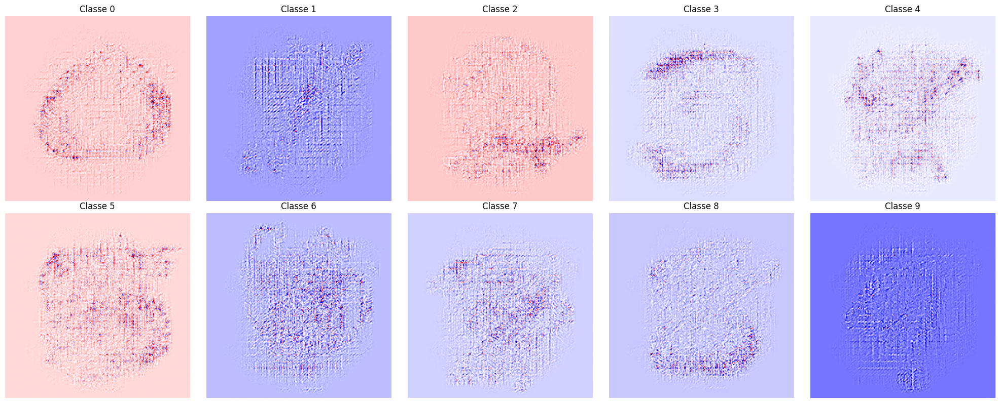

[INFO] Analisi SHAP completata.


{0: array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 1: array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 2: array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 3: array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.,

In [ ]:
xai.shap_class_explanations(subset_dataset)

INTEGRATED GRADIENTS


GRADCAM

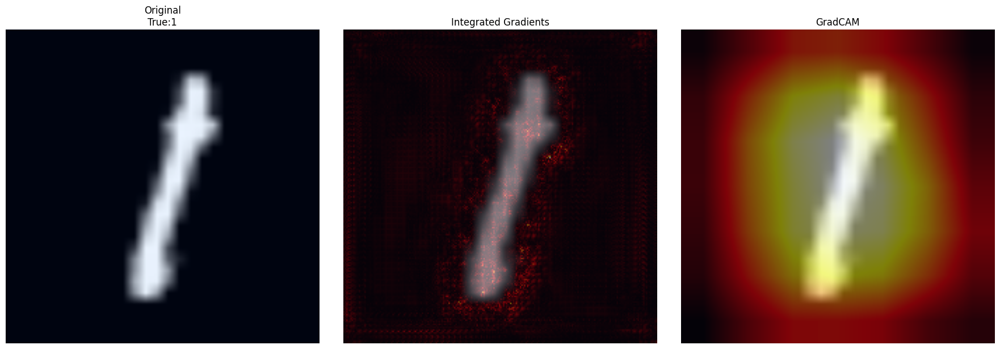

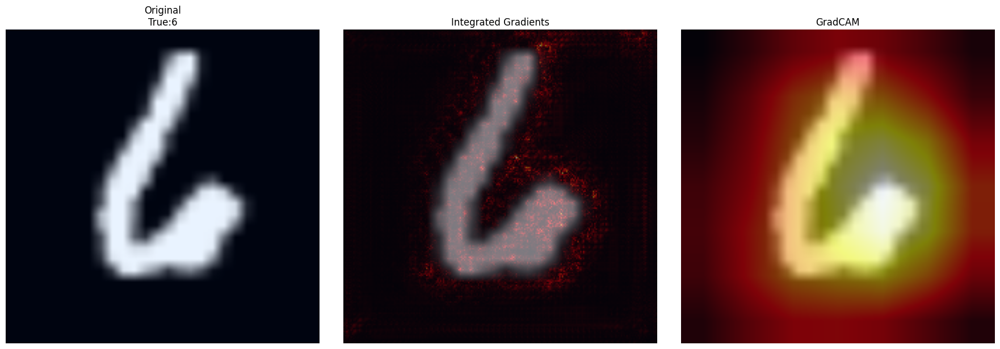

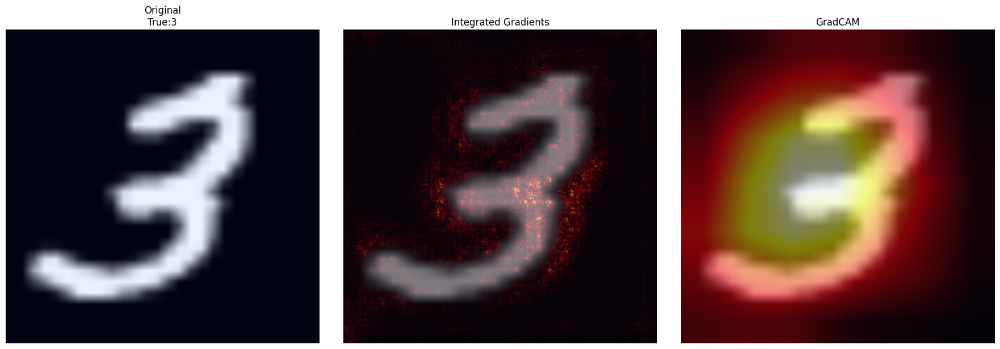

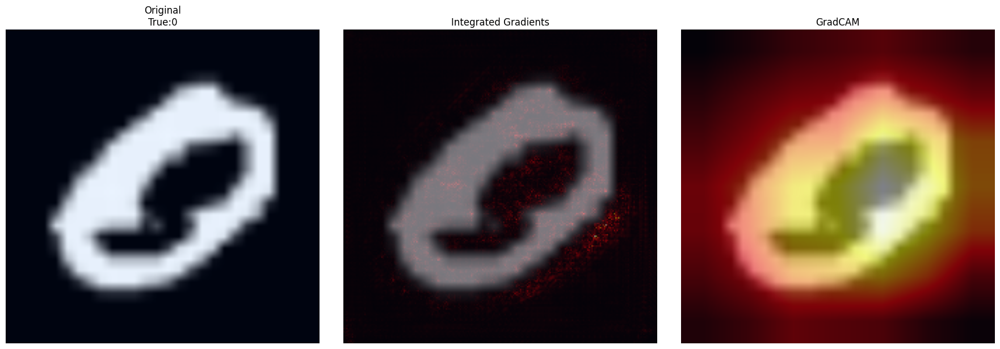

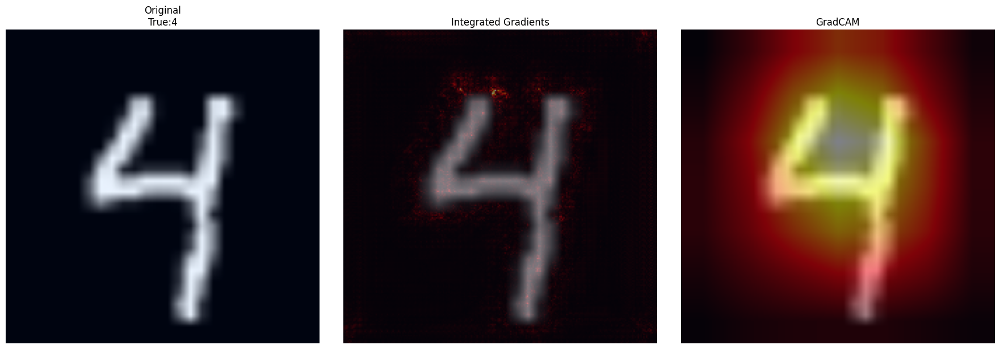

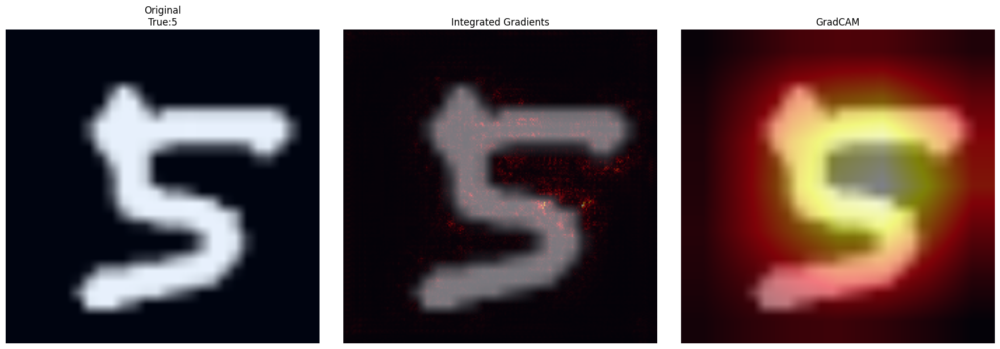

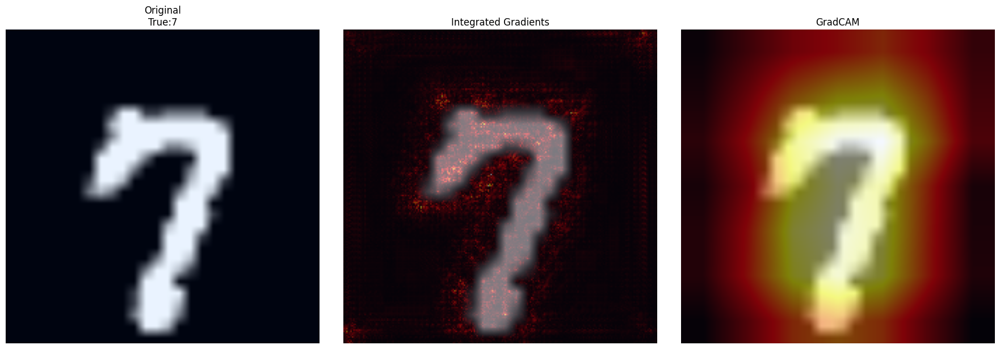

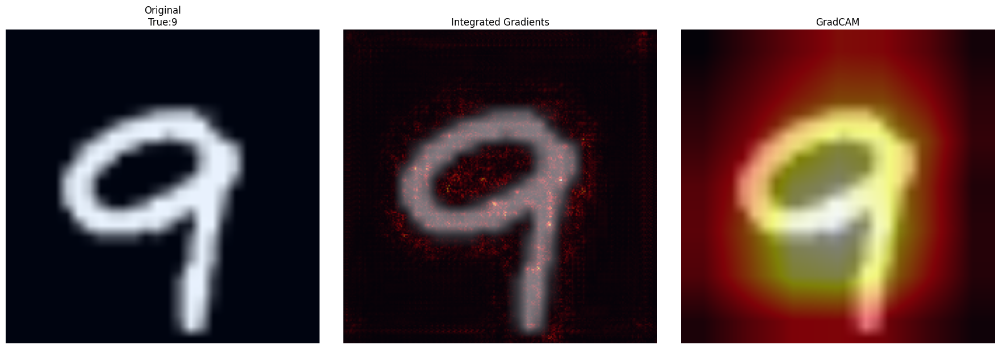

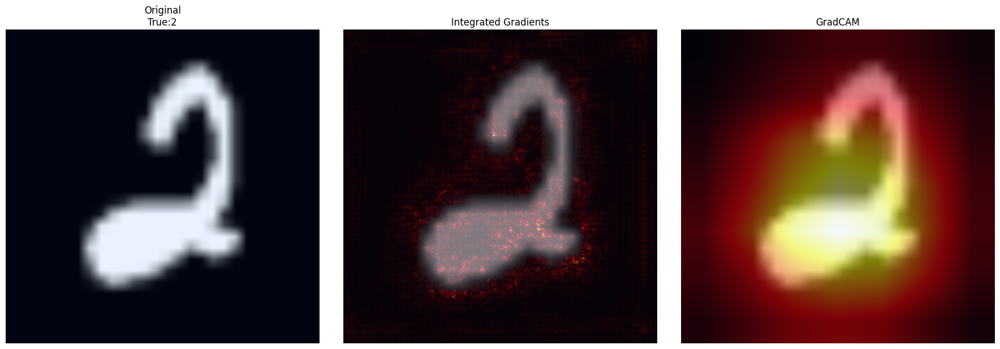

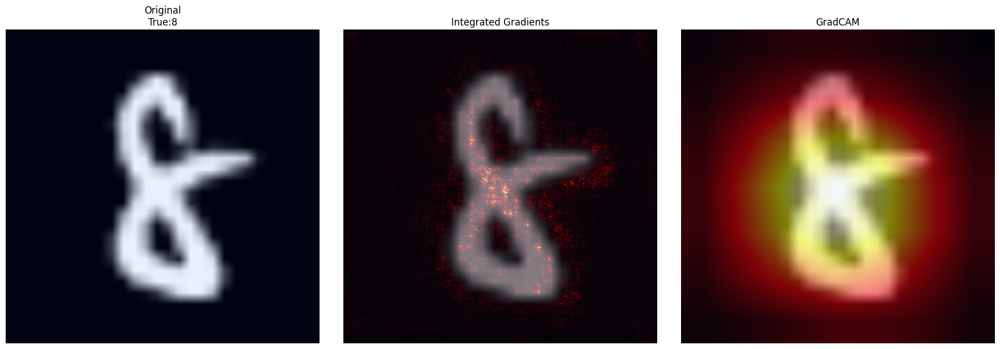

In [ ]:
xai.integrated_gradients_gradcam(test_loader)

/usr/local/lib/python3.12/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


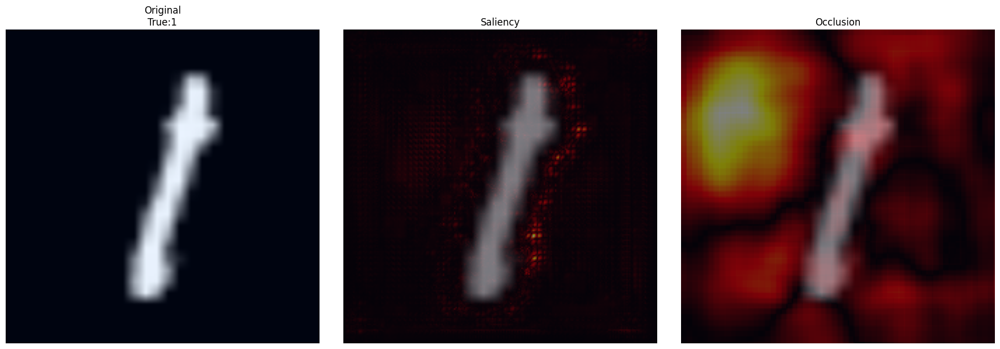

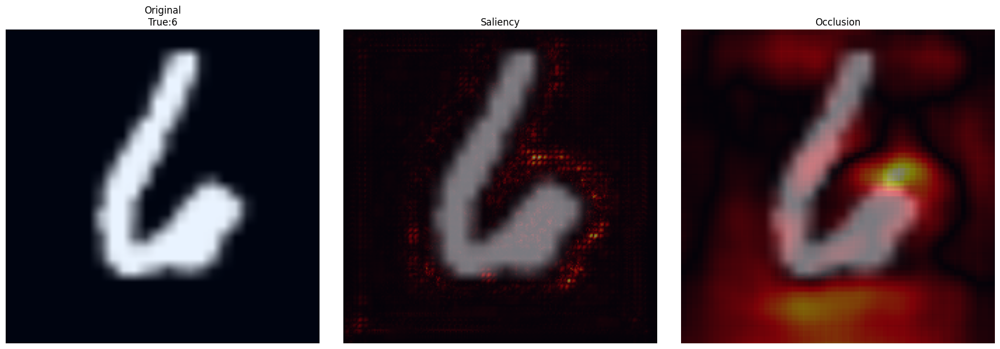

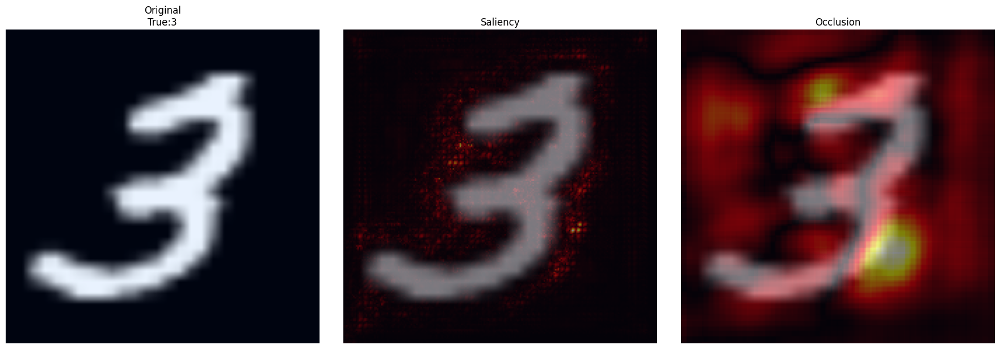

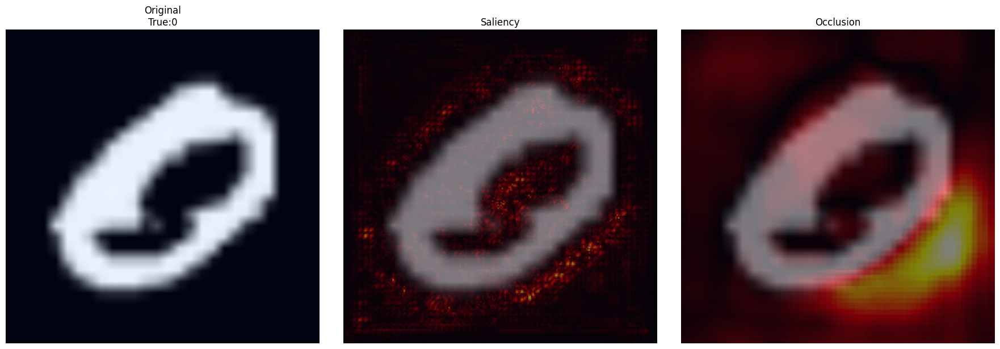

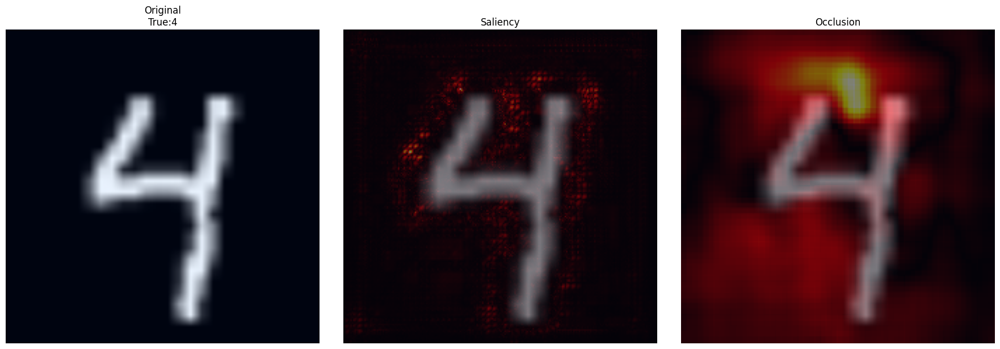

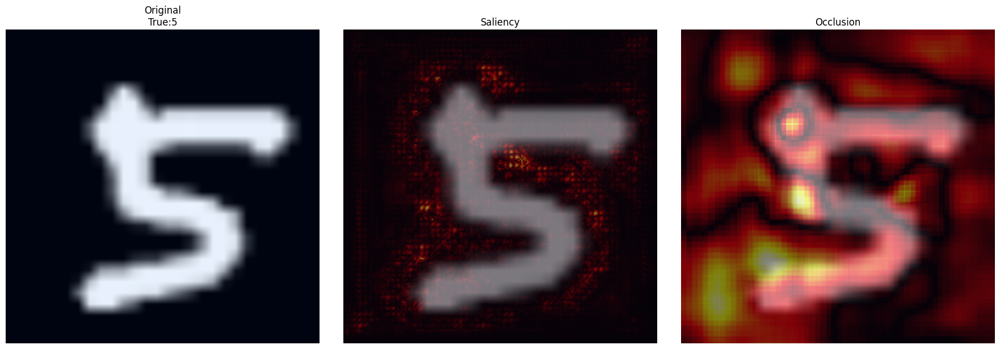

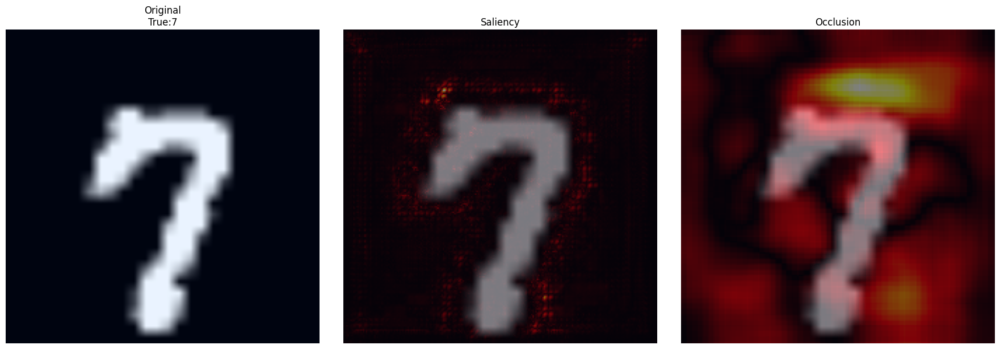

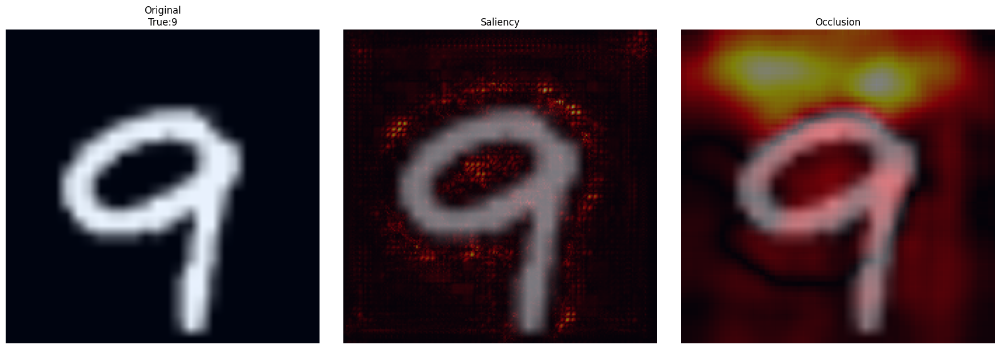

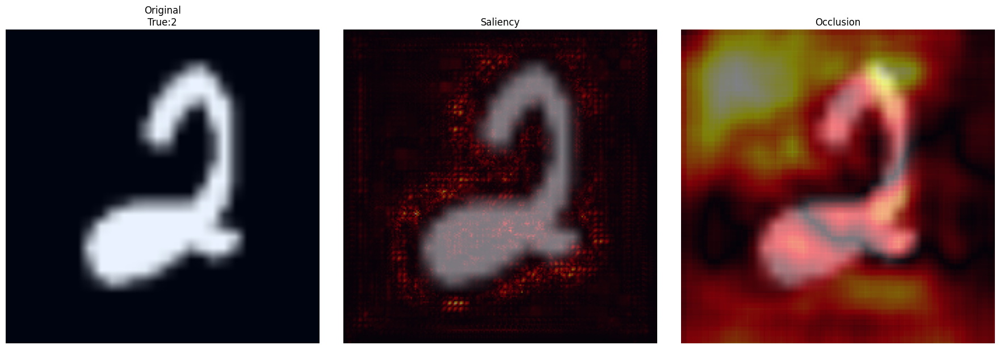

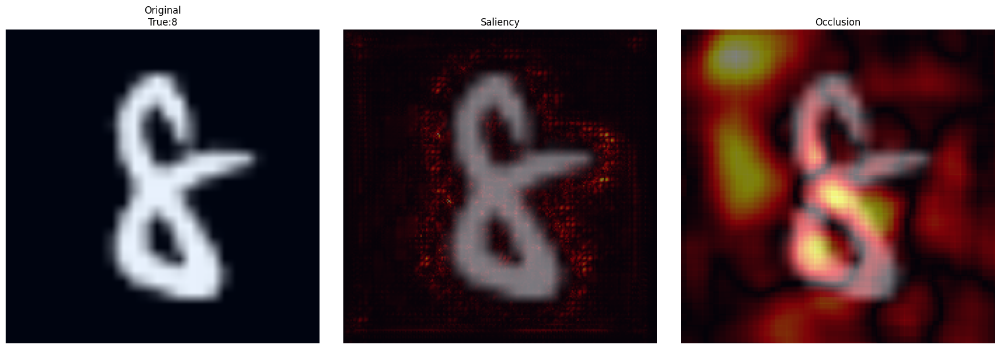

In [ ]:
xai.occlusion_saliency(test_loader)

GLASSBOX ALTERNATIVA

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
from tqdm import tqdm

X = []
y = []
print(f"Loading dataset..")
N = len(train_loader.dataset)  # numero totale di immagini
C, H, W = 3, 224, 224
X_memmap = np.memmap("X.dat", dtype=np.float32, mode="w+", shape=(N, C*H*W))
y_memmap = np.memmap("y.dat", dtype=np.int32, mode="w+", shape=(N,))

idx = 0
for img, label in tqdm(train_loader,"train"):
    B = img.shape[0]
    X_memmap[idx:idx+B] = img.view(B, -1).numpy().astype(np.float32)
    y_memmap[idx:idx+B] = label.numpy()
    idx += B

X = X_memmap  # non è tutto in RAM, ma sul disco
y = y_memmap


"""
for img, label in tqdm(train_loader,"train"):
    B, C, H, W = img.shape
    X.append(img.view(B, -1).numpy().astype(np.float32))
    y.append(label.numpy())
X = np.vstack(X).astype(np.float32)
y = np.concatenate(y)
n_samples = 5000  # riduzione complessità per limiti RAM
X = X[:n_samples]
y = y[:n_samples]
"""

print(f"Shape X: {X.shape}, y: {y.shape}")

#Feature names come coordinate
C, H, W = 3, 224, 224
feature_names = [f"{i//(H*W)}_{(i//W)%H}_{i%W}" for i in range(X.shape[1])]

# Fit
max_depth = 10
model = DecisionTreeClassifier(random_state=42, max_depth=max_depth)

print("✅ Training Decision Tree")
for d in tqdm(range(1, max_depth + 1), desc="Profondità albero"):
    model.max_depth = d
    model.fit(X, y)
    y_pred = model.predict(X)
    acc = accuracy_score(y, y_pred)
    print(f"Depth {d} -> Accuracy: {acc:.4f}")

print("Fit completato!")
print("Accuratezza finale:", accuracy_score(y, y_pred))
print(classification_report(y, y_pred))

#Feature importances
importances = model.feature_importances_
indices_sorted = np.argsort(importances)[::-1]
top_n = 20

plt.figure(figsize=(12,4))
plt.bar(range(top_n), importances[indices_sorted][:top_n], color='orange')
plt.xticks(range(top_n), [feature_names[i] for i in indices_sorted[:top_n]], rotation=90)
plt.title(f"Top {top_n} Feature Importances (globali)")
plt.ylabel("Importance")
plt.xlabel("Pixel (canale_riga_colonna)")
plt.tight_layout()
plt.show()



Loading dataset..


train: 100%|██████████| 170/170 [01:30<00:00,  1.88it/s]


Shape X: (10840, 150528), y: (10840,)
✅ Training Decision Tree


Profondità albero:   0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import PartialDependenceDisplay

def top_pixels(model, train_loader, image_size=(224,224), top_n_bar=20, top_n_image=20):
    """
    Mostra:
        - Bar plot globale dei pixel più decisivi
        - Per ogni classe: immagine reale con i top_n_image pixel segnati
    """
    C, H, W = 3, image_size[0], image_size[1]
    feature_names = [f"{i//(H*W)}_{(i//W)%H}_{i%W}" for i in range(model.n_features_in_)]

    tree = model.tree_
    children_left = tree.children_left
    children_right = tree.children_right
    feature = tree.feature
    value = tree.value

    # Ricorsione per raccogliere feature nei percorsi per ciascuna classe
    def collect_paths(node, path, paths_per_class):
        if children_left[node] == children_right[node]:  # foglia
            class_idx = np.argmax(value[node][0])
            if class_idx not in paths_per_class:
                paths_per_class[class_idx] = []
            paths_per_class[class_idx].append(list(path))
            return
        if children_left[node] != -1:
            collect_paths(children_left[node], path + [feature[node]], paths_per_class)
        if children_right[node] != -1:
            collect_paths(children_right[node], path + [feature[node]], paths_per_class)

    paths_per_class = {}
    collect_paths(0, [], paths_per_class)

    # Bar plot
    all_features = [f for paths in paths_per_class.values() for path in paths for f in path if f >=0]
    unique, counts = np.unique(all_features, return_counts=True)
    sorted_idx = np.argsort(counts)[::-1]
    top_features = unique[sorted_idx]
    top_counts = counts[sorted_idx]

    top_n = min(top_n_bar, len(top_features))
    plt.figure(figsize=(12,4))
    plt.bar(range(top_n), top_counts[:top_n], color='orange')
    plt.xticks(range(top_n), [feature_names[i] for i in top_features[:top_n]], rotation=90)
    plt.title(f"Top {top_n} pixel decisivi globali")
    plt.ylabel("Frequenza nei percorsi")
    plt.xlabel("Pixel (canale_riga_colonna)")
    plt.tight_layout()
    plt.show()

    #Immagini per classe
    images_per_class = {}
    for img, labels in train_loader:
        for i in range(img.shape[0]):
            cls = labels[i].item()
            if cls not in images_per_class:
                images_per_class[cls] = img[i].permute(1,2,0).numpy()  # HWC

    top_n_img = min(top_n_image, len(top_features))
    top_idx_img = top_features[:top_n_img]

    for cls in sorted(paths_per_class.keys()):
        if cls in images_per_class:
            img_real = images_per_class[cls]
        else:
            img_real = np.ones((H,W,3))
        plt.figure(figsize=(6,6))
        plt.imshow(img_real)
        for i in top_idx_img:
            channel = i // (H*W)
            pos = i % (H*W)
            row = pos // W
            col = pos % W
            plt.scatter(col, row, color='red', s=50)
            plt.text(col, row, str(i), color='black', fontsize=8, ha='center', va='center')
        plt.title(f"Classe {cls}: Top {top_n_img} pixel sulla immagine reale")
        plt.axis('off')
        plt.show()

    return paths_per_class, feature_names


SPIEGAZIONE SCELTE MODELLO


In [ ]:
paths_per_class, feature_names = top_pixels(
    model,
    train_loader,
    image_size=(224,224),
    top_n_bar=20,
    top_n_image=8
)


In [ ]:
from matplotlib.lines import Line2D

# Per ogni classe genera un'immagine RGB media e evidenzia i top_k pixel SHAP
# che influenzano la probabilità della classe.

def shap_per_class(model, X, top_k=20):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    n_classes = len(model.classes_)
    C, H, W = 3, 224, 224

    # immagine media
    img_mean = X.reshape(-1, C, H, W).mean(axis=0).transpose(1,2,0)

    for cls in model.classes_:
        # shap values medi su tutte le immagini
        if isinstance(shap_values, np.ndarray) and shap_values.ndim == 3:
            shap_cls = shap_values[:, :, cls].mean(axis=0)  # shape (n_features,)
        else:
            shap_cls = np.array([sv[cls] for sv in shap_values]).mean(axis=0)

        shap_img = shap_cls.reshape(C,H,W)
        top_idx = np.argsort(np.abs(shap_cls))[-top_k:]

        # converti indici in coordinate
        rows = top_idx // (H*C)
        cols = (top_idx // C) % W

        plt.figure(figsize=(6,6))
        plt.imshow(img_mean)

        for r,c in zip(rows, cols):
            color = 'red' if shap_cls[r*C*W + c*C] > 0 else 'blue'
            plt.scatter(c, r, color=color, s=80, alpha=0.7, edgecolors='white')

        # spiegazione
        legend_elements = [
            Line2D([0], [0], marker='o', color='w', label='Aumenta probabilità', markerfacecolor='red', markersize=10),
            Line2D([0], [0], marker='o', color='w', label='Diminuisce probabilità', markerfacecolor='blue', markersize=10)
        ]
        plt.legend(handles=legend_elements, loc='upper right')

        plt.title(f"Classe {cls} - Top {top_k} pixel SHAP")
        plt.axis("off")
        plt.show()


In [ ]:
shap_per_class(model, X, top_k=30)

SHAP

CONCLUSIONI
